# CONTENT

# 1. IMPORTINGS

In [1]:
import os
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from imageio.v2 import imread
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
print("modules imported, Ready to fire the stage")

modules imported, Ready to fire the stage


# 2. READ IMAGES

In [2]:
path = "./intel"

In [3]:
os.listdir(path)

['mbnetv2_trained_model.keras',
 'test',
 'train',
 'xception_trained_model.keras']

In [4]:
os.listdir(path+'/train'+'/sea')[:10]

['1.jpg',
 '10016.jpg',
 '10041.jpg',
 '10053.jpg',
 '10061.jpg',
 '10068.jpg',
 '10071.jpg',
 '10080.jpg',
 '10087.jpg',
 '10093.jpg']

In [21]:
# --- USER CONFIG ---
train_dir = "intel/train"
test_dir = "intel/test"
class_names=os.listdir(path+'/train')
class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [6]:
# change these if you already have values elsewhere
input_shape = (224, 224)   # (height, width)
batch_size = 32

In [7]:
# --- helper to print class pixel stats ---
def print_pixel_stats(root_dir, label):
    print(f"\n=== Pixel stats for {label} (root: {root_dir}) ===")
    if not os.path.isdir(root_dir):
        print(f"Directory not found: {root_dir}")
        return

    classes = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]
    classes.sort()
    print("Classes:", classes)

    for intel_class in classes:
        class_path = os.path.join(root_dir, intel_class)
        max_values, min_values = [], []

        for image_name in os.listdir(class_path):
            img_path = os.path.join(class_path, image_name)
            try:
                img = imread(img_path)
            except Exception as e:
                print(f"  ⚠️ cannot read {img_path}: {e}")
                continue

            # If image has channels, compute pixel range across all channels
            try:
                maxi = float(img.max())
                mini = float(img.min())
            except Exception:
                # fallback in case img is weird
                maxi, mini = None, None

            if maxi is not None:
                max_values.append(maxi)
            if mini is not None:
                min_values.append(mini)

        print("*")
        print(f"Class: {intel_class}")
        if max_values:
            print(f"Max pixel value: {max(max_values)}")
        else:
            print("Max pixel value: N/A")
        if min_values:
            print(f"Min pixel value: {min(min_values)}")
        else:
            print("Min pixel value: N/A")
    print("*\n")

# Print stats for train and test
print_pixel_stats(train_dir, "TRAIN")
print_pixel_stats(test_dir, "TEST")


=== Pixel stats for TRAIN (root: intel/train) ===
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
*
Class: buildings
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: forest
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: glacier
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: mountain
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: sea
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: street
Max pixel value: 255.0
Min pixel value: 0.0
*


=== Pixel stats for TEST (root: intel/test) ===
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
*
Class: buildings
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: forest
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: glacier
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: mountain
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: sea
Max pixel value: 255.0
Min pixel value: 0.0
*
Class: street
Max pixel value: 255.0
Min pixel value: 0.0
*



# 3. TRAIN-VALIDATION SPLIT

In [147]:
import random
import os
import shutil
limit_per_class = 200
limited_train_dir = "limited_train"
os.makedirs(limited_train_dir, exist_ok=True)

for cls in os.listdir(train_dir):
    cls_path = os.path.join(train_dir, cls)
    if not os.path.isdir(cls_path):
        continue
    all_images = [f for f in os.listdir(cls_path) if os.path.isfile(os.path.join(cls_path, f))]
    if len(all_images) < limit_per_class:
        print(f"Skipping {cls}: only {len(all_images)} images available (need {limit_per_class}).")
        continue
    selected = random.sample(all_images, limit_per_class)
    dest_cls = os.path.join(limited_train_dir, cls)
    os.makedirs(dest_cls, exist_ok=True)
    for img_name in selected:
        shutil.copy(os.path.join(cls_path, img_name), os.path.join(dest_cls, img_name))
print("✅ Created limited_train with up to", limit_per_class, "images per class.")
train_dir = limited_train_dir
train_dir = limited_train_dir


✅ Created limited_train with up to 200 images per class.


In [47]:
train_dir = "intel/train"
seed = 123
input_size = (256, 256)       # height, width for image_dataset_from_directory
model_input_shape = (256, 256, 3)  # for model creation (H, W, C)
batch_size = 64
validation_split = 0.2

In [48]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=validation_split,
    subset="training",
    seed=seed,
    image_size=input_size,   # (H, W)
    batch_size=batch_size,
    label_mode="int"
)


Found 14034 files belonging to 6 classes.
Using 11228 files for training.


In [49]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=validation_split,
    subset="validation",
    seed=seed,
    image_size=input_size,   # (H, W)
    batch_size=batch_size,
    label_mode="int"
)

Found 14034 files belonging to 6 classes.
Using 2806 files for validation.


In [151]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    shuffle=False,
    image_size=input_shape,
    batch_size=batch_size,
    label_mode="int"
)

Found 3000 files belonging to 6 classes.


In [22]:

# class_names = train_ds.class_names
print("Class names:", class_names)

Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


See different split techniques at : https://www.kaggle.com/code/eneskosar19/image-classification-pipeline-tensorflow

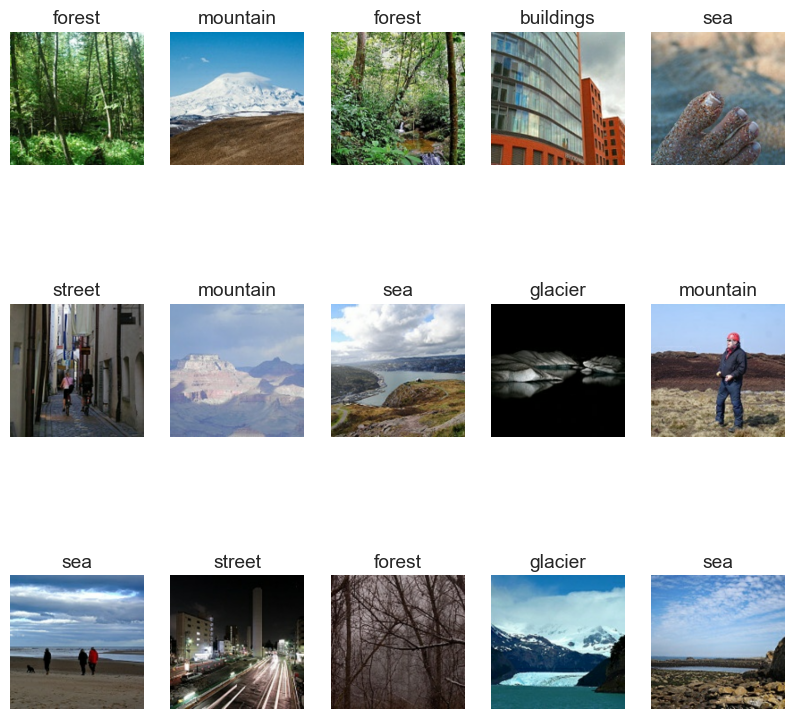

In [153]:
# --- Visualize sample images ---
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(15):
        ax = plt.subplot(3, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

# 3. SCALING

**Importance of Data Set Scaling**
Data set scaling is a crucial step in TensorFlow that can significantly speed up model training. Especially when working with large datasets, this process can dramatically impact the model's convergence time and overall performance.

**Benefits of Scaling:**

1. Faster Training: Scaling can significantly reduce training time by increasing the model's access and processing speed of the dataset. This leads to faster results and shorter development cycles.
2. Enhanced Performance: A proper scaling strategy can optimize overall performance by helping the model learn patterns in the dataset more efficiently.
3. Memory Efficiency: Data set scaling can help the model occupy less memory, which is crucial especially when working with large datasets.
4. Overall Resource Optimization: Proper scaling can ensure more efficient use of CPU, GPU, and other hardware resources, optimizing overall system performance.

In [10]:
# --- Normalize images (convert to [0, 1]) ---
train_ds = train_ds.map(lambda x, y: (x / 255.0, y))
val_ds = val_ds.map(lambda x, y: (x / 255.0, y))

# 4.1. CACHE AND PREFETCH

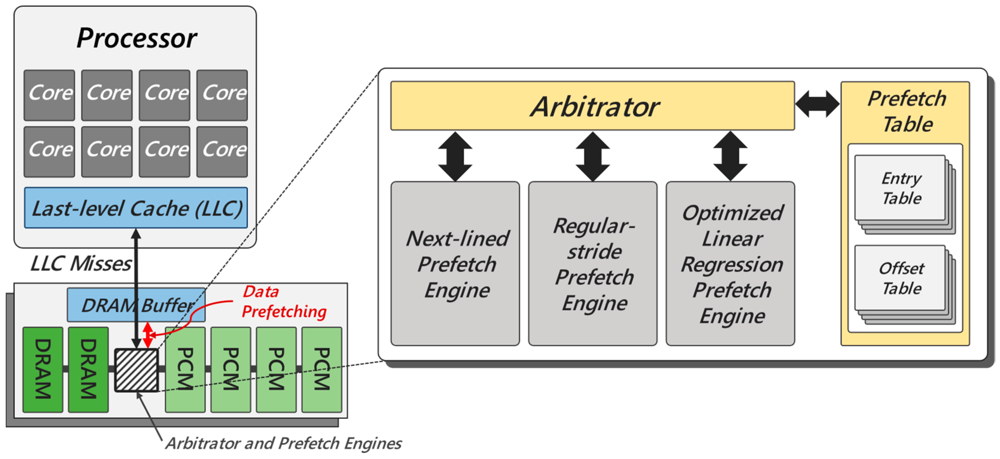

In [44]:
# --- Prefetch for performance ---
AUTOTUNE = tf.data.AUTOTUNE
# If your dataset fits in memory, cache() before shuffle() is beneficial.
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds   = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
# test_ds  = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

1. **Caching**: Stores data in memory after first load (both training and validation). This dramatically reduces disk access time, significantly speeding up training, especially for large datasets.

2. **Shuffling** (training only): Randomizes data order to prevent overfitting. This helps the model learn general patterns from the data, leading to better performance on unseen examples.
  
3. **Prefetching with Autotune** (both): Overlaps data prep with model training, using optimal buffer size based on your hardware. This hides data processing latency, allowing the model to work continuously and potentially reducing training time.

In [33]:
# --- Check pixel range of first image in first batch ---
image_batch, labels_batch = next(iter(train_ds))
first_image = image_batch[0]
print("Normalized pixel range (train first image):", np.min(first_image.numpy()), np.max(first_image.numpy()))

Normalized pixel range (train first image): 0.0 1.0


In [34]:
image_batch, labels_batch = next(iter(train_ds)) #This is how you read image batches, each batch contains 64 images and 64 related labels

In [35]:
first_image = image_batch[0]

Now it's scaled

# 5.1 CREATE MODEL

In [36]:
input_shape = (256, 256, 3)   # your stated input shape
num_classes = len(class_names)
print("Input shape:", input_shape)
print("Num classes:", num_classes)

Input shape: (256, 256, 3)
Num classes: 6


In [160]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

model = Sequential([
    Input(shape=input_shape),

    Conv2D(16, (3,3), padding='same', activation='relu'),
    MaxPooling2D(),

    Conv2D(32, (3,3), padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),

    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D(),

    Conv2D(128, (3,3), padding='same', activation='relu'),
    MaxPooling2D(),

    Conv2D(256, (3,3), padding='same', activation='relu'),
    MaxPooling2D(),

    Flatten(),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# 5.2 COMPILE

In [161]:
# -------------------------------------------------------------
# Compile model
# -------------------------------------------------------------
model.compile(
    optimizer=Adam(learning_rate=0.003),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_23 (Conv2D)                   │ (None, 256, 256, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 128, 128, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 64)                  │       1,048,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,443,782 (5.51 MB)

 Trainable params: 1,443,654 (5.51 MB)

 Non-trainable params: 128 (512.00 B)

In [162]:
# -------------------------------------------------------------
# Define Callbacks
# -------------------------------------------------------------
red_lr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose=1, factor=0.1)

class GetBestModel(tf.keras.callbacks.Callback):
    """Stores best model weights based on monitored metric."""
    def __init__(self, monitor="val_loss", mode="min"):
        super().__init__()
        self.monitor, self.mode = monitor, mode
        self.best = np.inf if mode == "min" else -np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get(self.monitor)
        if current is None: return
        if (self.mode == "min" and current < self.best) or (self.mode == "max" and current > self.best):
            self.best = current
            self.best_weights = self.model.get_weights()

    def on_train_end(self, logs=None):
        self.model.set_weights(self.best_weights)

best_model = GetBestModel(monitor="val_loss", mode="min")
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [163]:
# -------------------------------------------------------------
# Train the model
# -------------------------------------------------------------
epochs=25

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stop, red_lr, best_model],
    verbose=1
)

Epoch 1/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.3799 - loss: 1.5159 - val_accuracy: 0.3037 - val_loss: 2.8770 - learning_rate: 0.0030
Epoch 2/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 26s 885ms/step - accuracy: 0.5346 - loss: 1.2018 - val_accuracy: 0.4165 - val_loss: 1.9133 - learning_rate: 0.0030
Epoch 3/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 18s 604ms/step - accuracy: 0.5736 - loss: 1.1024 - val_accuracy: 0.1627 - val_loss: 13.3657 - learning_rate: 0.0030
Epoch 4/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 17s 596ms/step - accuracy: 0.5855 - loss: 1.1001 - val_accuracy: 0.3037 - val_loss: 3.8378 - learning_rate: 0.0030
Epoch 5/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.6198 - loss: 1.0035
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00030000000260770325.
29/29 ━━━━━━━━━━━━━━━━━━━━ 18s 625ms/step - accuracy: 0.6180 - loss: 1.0080 - val_accuracy: 0.2993 - val_loss: 3.2414 - learning_rate: 0.0030
Epoch 6/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 823ms/step - accuracy: 0.6434 - loss: 0.932

Let's get the insights about the model

# 5.5 VISUALIZE THE TRAIN RESULTS

    accuracy      loss  val_accuracy  val_loss  learning_rate
11  0.668831  0.863992      0.531453  1.039516       0.000300
12  0.683442  0.847940      0.559653  0.997265       0.000030
13  0.679654  0.854396      0.574837  0.955421       0.000030
14  0.682900  0.845432      0.574837  0.953447       0.000030
15  0.680736  0.847096      0.585683  0.939988       0.000003


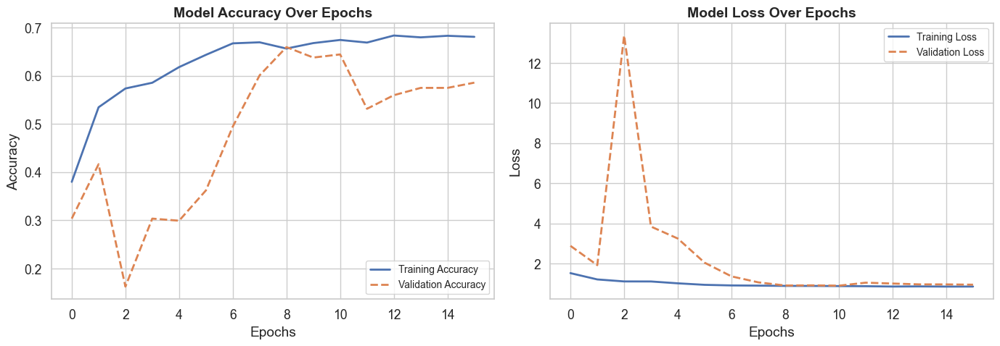

In [164]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.15)

history_dict = history.history
history_df = pd.DataFrame(history_dict)
print(history_df.tail())

# Determine accuracy keys (tf sometimes uses "accuracy" or "acc")
acc_key = None
val_acc_key = None
for k in history_df.columns:
    if k.lower() in ("accuracy", "acc") and not k.startswith("val_"):
        acc_key = k
    if k.lower() in ("val_accuracy", "val_acc", "val-accuracy") or k.startswith("val_") and ("acc" in k or "accuracy" in k):
        val_acc_key = k

# Fallback if detection failed
if acc_key is None:
    for k in history_df.columns:
        if "acc" in k.lower() or "accuracy" in k.lower():
            acc_key = k
            break

if val_acc_key is None:
    for k in history_df.columns:
        if k.startswith("val_") and ("acc" in k.lower() or "accuracy" in k.lower()):
            val_acc_key = k
            break

# Loss keys
loss_key = "loss"
val_loss_key = None
for k in history_df.columns:
    if k.startswith("val_") and "loss" in k:
        val_loss_key = k
        break
if val_loss_key is None and "val_loss" in history_df.columns:
    val_loss_key = "val_loss"

# --- Plot (handles missing keys gracefully) ---
plt.figure(figsize=(14, 5))

# Accuracy subplot
plt.subplot(1, 2, 1)
if acc_key and val_acc_key:
    plt.plot(history_df[acc_key], label="Training Accuracy", linewidth=2)
    plt.plot(history_df[val_acc_key], label="Validation Accuracy", linewidth=2, linestyle="--")
    plt.ylabel("Accuracy")
    plt.xlabel("Epochs")
    plt.title("Model Accuracy Over Epochs", fontsize=14, fontweight='bold')
    plt.legend(loc="lower right", fontsize=10)
else:
    plt.text(0.5, 0.5, "Accuracy keys not found in history.", ha="center", va="center")
    plt.axis("off")

# Loss subplot
plt.subplot(1, 2, 2)
if loss_key in history_df.columns and val_loss_key in history_df.columns:
    plt.plot(history_df[loss_key], label="Training Loss", linewidth=2)
    plt.plot(history_df[val_loss_key], label="Validation Loss", linewidth=2, linestyle="--")
    plt.ylabel("Loss")
    plt.xlabel("Epochs")
    plt.title("Model Loss Over Epochs", fontsize=14, fontweight='bold')
    plt.legend(loc="upper right", fontsize=10)
else:
    plt.text(0.5, 0.5, "Loss keys not found in history.", ha="center", va="center")
    plt.axis("off")

plt.tight_layout()
plt.show()


So we can see it's overfit while val_los is increasing,train_los is decrease

# 7. TRANSFER LEARNİNG

In [166]:
from tensorflow.keras.applications import MobileNetV2, Xception
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [45]:
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
num_classes = len(class_names)
input_shape = (256, 256, 3)

In [168]:
# -------------------------------------------------------------
# Xception (Frozen Base)
# -------------------------------------------------------------
Xception_model = Sequential()

pretrained_xcep = Xception(
    include_top=False,
    input_shape=input_shape,
    pooling='avg',
    weights='imagenet'
)

In [169]:
# Freeze base layers
for layer in pretrained_xcep.layers:
    layer.trainable = False

In [170]:
# Build head
Xception_model.add(pretrained_xcep)
Xception_model.add(Dense(512, activation='relu'))
Xception_model.add(Dense(512, activation='relu'))
Xception_model.add(Dropout(0.2))  # ✅ fixed typo (was 0,2)
Xception_model.add(Dense(num_classes, activation='softmax'))

In [171]:
Xception_model.compile(
    optimizer=Adam(learning_rate=0.003),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
Xception_model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 6)                   │           3,078 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,176,302 (84.60 MB)

 Trainable params: 1,314,822 (5.02 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [174]:
# Train
Xception_results = Xception_model.fit(
    train_ds,
    epochs=25,
    validation_data=val_ds,
    callbacks=[early_stop]
)

Epoch 1/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 122s 4s/step - accuracy: 0.9313 - loss: 0.1915 - val_accuracy: 0.8894 - val_loss: 0.3251
Epoch 2/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 141s 4s/step - accuracy: 0.9508 - loss: 0.1427 - val_accuracy: 0.8742 - val_loss: 0.4057
Epoch 3/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 121s 4s/step - accuracy: 0.9497 - loss: 0.1342 - val_accuracy: 0.8894 - val_loss: 0.3816
Epoch 4/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 121s 4s/step - accuracy: 0.9389 - loss: 0.1990 - val_accuracy: 0.8482 - val_loss: 0.4555
Epoch 5/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 122s 4s/step - accuracy: 0.9535 - loss: 0.1205 - val_accuracy: 0.8764 - val_loss: 0.4259
Epoch 6/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 120s 4s/step - accuracy: 0.9713 - loss: 0.0803 - val_accuracy: 0.8677 - val_loss: 0.5432
Epoch 7/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 121s 4s/step - accuracy: 0.9751 - loss: 0.0659 - val_accuracy: 0.8655 - val_loss: 0.5591
Epoch 8/25
29/29 ━━━━━━━━━━━━━━━━━━━━ 142s 4s/step - accuracy: 0.9876 - loss: 0.0362 - val_accuracy: 0.8850 - v

In [29]:
save_path = "./intel/xception_trained_model.keras"
Xception_model.save(save_path, include_optimizer=False)   # exclude optimizer if you only need model for inference
print(f"Model saved to: {save_path}")

NameError: name 'Xception_model' is not defined

In [52]:
import tensorflow as tf
import numpy as np
import os

# Print cardinality and a sample from val_ds
try:
    print("val_ds cardinality:", tf.data.experimental.cardinality(val_ds).numpy())
except Exception as e:
    print("Could not get cardinality:", e)

# Try to fetch one batch and print shapes
try:
    batch = next(iter(val_ds))
    images, labels = batch
    print("Sample batch images shape:", images.shape)
    print("Sample batch labels shape:", labels.shape)
    print("Sample labels unique counts:", np.unique(labels.numpy(), return_counts=True))
except StopIteration:
    print("val_ds is empty (StopIteration).")
except Exception as e:
    print("Error getting a batch from val_ds:", type(e).__name__, e)


val_ds cardinality: 44
Sample batch images shape: (64, 256, 256, 3)
Sample batch labels shape: (64,)
Sample labels unique counts: (array([0, 1, 2, 3, 4, 5], dtype=int32), array([14, 15, 10, 10,  9,  6]))


Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Collected images: (2806, 256, 256, 3) labels: (2806,)
Detected pixel range >1. Normalizing images by /255.0 before prediction.
Selected 60 samples (10 per class max).
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


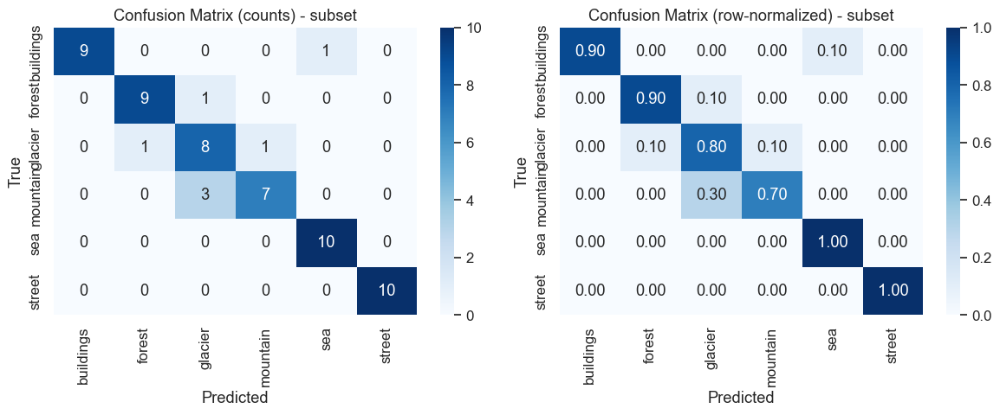


Classification Report (subset):

              precision    recall  f1-score   support

   buildings     1.0000    0.9000    0.9474        10
      forest     0.9000    0.9000    0.9000        10
     glacier     0.6667    0.8000    0.7273        10
    mountain     0.8750    0.7000    0.7778        10
         sea     0.9091    1.0000    0.9524        10
      street     1.0000    1.0000    1.0000        10

    accuracy                         0.8833        60
   macro avg     0.8918    0.8833    0.8841        60
weighted avg     0.8918    0.8833    0.8841        60



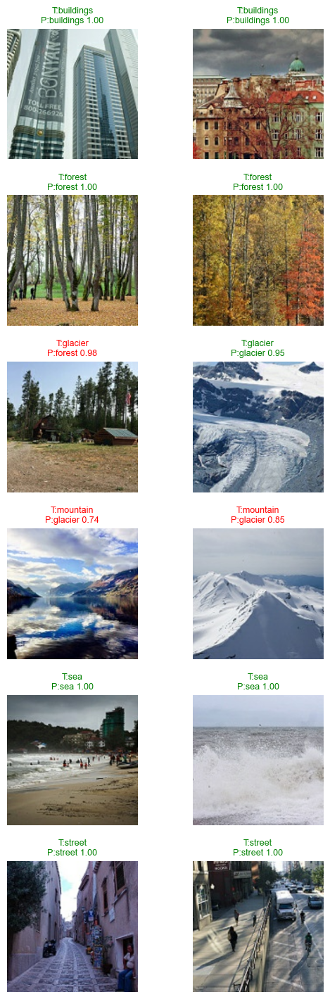

In [61]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import random
import os
save_path = "./intel/xception_trained_model.keras"
# -------- USER CONFIG --------
model = tf.keras.models.load_model(save_path)        # use your trained MobileNetV2 model
dataset = val_ds                  # use validation dataset
train_dir = "intel/train"         # to reconstruct class names
per_class = 10                    # max images to take per class (set lower to speed up)
predict_batch_size = 64           # batch size used for model.predict on subset
show_examples_per_class = 2       # examples to display per class (0 to disable)
random_seed = 42
# ------------------------------

random.seed(random_seed)
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

# Reconstruct class names (alphabetical)
class_names = sorted([d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))])
num_classes = len(class_names)
print("Class names:", class_names)

# Unbatch val dataset and collect (image, label) pairs into lists (up to a limit to avoid OOM)
images = []
labels = []
for batch_x, batch_y in dataset:
    bx = batch_x.numpy()
    by = batch_y.numpy()
    for i in range(bx.shape[0]):
        images.append(bx[i])
        labels.append(int(by[i]))
# Convert to arrays
images = np.array(images)
labels = np.array(labels)
print("Collected images:", images.shape, "labels:", labels.shape)

# Detect whether images are in 0-255 range (and normalize if needed)
if images.max() > 1.1:
    print("Detected pixel range >1. Normalizing images by /255.0 before prediction.")
    images_norm = images.astype(np.float32) / 255.0
else:
    images_norm = images.astype(np.float32)

# Stratified sampling: pick up to `per_class` images per class
selected_idxs = []
for cls in range(num_classes):
    idxs = np.where(labels == cls)[0].tolist()
    if len(idxs) == 0:
        continue
    chosen = random.sample(idxs, min(per_class, len(idxs)))
    selected_idxs.extend(chosen)

# Keep selection order deterministic
selected_idxs = sorted(selected_idxs)
print(f"Selected {len(selected_idxs)} samples ({per_class} per class max).")

# Build subset arrays
X_subset = images_norm[selected_idxs]
y_subset = labels[selected_idxs]

# Predict in batches
subset_ds = tf.data.Dataset.from_tensor_slices(X_subset).batch(predict_batch_size)
y_prob = model.predict(subset_ds, verbose=1)
y_pred = np.argmax(y_prob, axis=1)

# Confusion matrix & classification report (on subset)
cm = confusion_matrix(y_subset, y_pred)
cm_norm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-12)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix (counts) - subset")
plt.xlabel("Predicted"); plt.ylabel("True")

plt.subplot(1,2,2)
sns.heatmap(cm_norm, annot=True, fmt='.2f', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix (row-normalized) - subset")
plt.xlabel("Predicted"); plt.ylabel("True")

plt.tight_layout(); plt.show()

print("\nClassification Report (subset):\n")
print(classification_report(y_subset, y_pred, target_names=class_names, digits=4))

# Optional: show a small grid of example predictions (stratified by true class)
if show_examples_per_class > 0:
    per_row = show_examples_per_class
    rows = num_classes
    plt.figure(figsize=(per_row * 3, rows * 2.4))
    plot_idx = 1
    for true_cls in range(num_classes):
        cls_idxs = [i for i, idx in enumerate(selected_idxs) if y_subset[i] == true_cls]
        if len(cls_idxs) == 0:
            continue
        pick = cls_idxs[:show_examples_per_class]
        for p in pick:
            img = X_subset[p]
            pred = y_pred[p]
            conf = float(y_prob[p, pred])
            plt.subplot(rows, per_row, plot_idx)
            disp = img
            # if image still in 0-255 range, scale for display
            if disp.max() > 1.1:
                disp = disp / 255.0
            plt.imshow(disp.astype(np.float32))
            color = "green" if pred == y_subset[p] else "red"
            plt.title(f"T:{class_names[y_subset[p]]}\nP:{class_names[pred]} {conf:.2f}", color=color, fontsize=9)
            plt.axis("off")
            plot_idx += 1
    plt.tight_layout()
    plt.show()


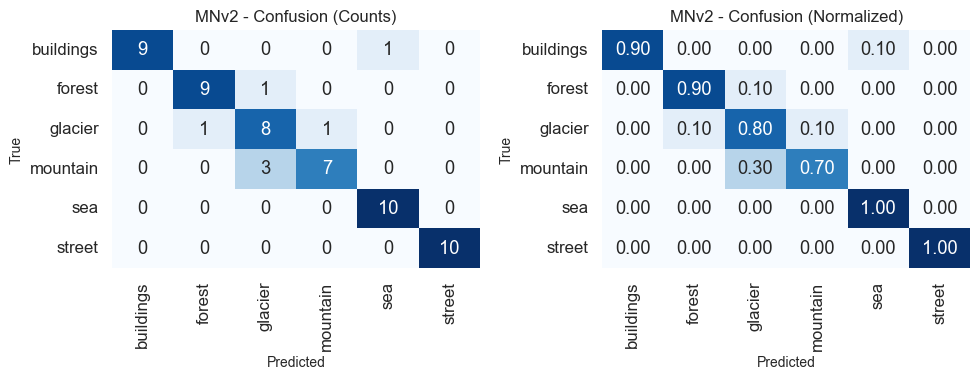

In [62]:
# ---------- Compact Confusion Matrix (Smaller Size) ----------
plt.figure(figsize=(10, 4))   # smaller figure
sns.set(font_scale=1.1)       # slightly smaller text

# Raw counts
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
            xticklabels=class_names, yticklabels=class_names,
            cbar=False)
plt.title("MNv2 - Confusion (Counts)", fontsize=12)
plt.xlabel("Predicted", fontsize=10)
plt.ylabel("True", fontsize=10)

# Normalized
plt.subplot(1, 2, 2)
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap="Blues",
            xticklabels=class_names, yticklabels=class_names,
            cbar=False)
plt.title("MNv2 - Confusion (Normalized)", fontsize=12)
plt.xlabel("Predicted", fontsize=10)
plt.ylabel("True", fontsize=10)

plt.tight_layout()
plt.show()

In [40]:
# ---------- 2) Predict on test set and gather true/pred labels ----------
# model.predict on a tf.data.Dataset returns probabilities for each sample in dataset order.
y_prob = model.predict(val_ds, verbose=1)
y_pred = np.argmax(y_prob, axis=1)

# Gather true labels from test_ds
y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)

# Safety check: shapes should match
print("y_true shape:", y_true.shape, "y_pred shape:", y_pred.shape)

ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "xception" is incompatible with the layer: expected shape=(None, 256, 256, 3), found shape=(32, 224, 224, 3)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(32, 224, 224, 3), dtype=float32)
  • training=False
  • mask=None
  • kwargs=<class 'inspect._empty'>

In [28]:
# ---------- 3) Confusion matrix and classification report ----------
if SKLEARN_OK:
    cm = confusion_matrix(y_true, y_pred)
    print("\nClassification report:\n")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))
else:
    cm = tf.math.confusion_matrix(y_true, y_pred).numpy()
    print("\nConfusion matrix computed with TensorFlow (sklearn not installed).")

# Plot confusion matrix (normalized and raw)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title("Confusion Matrix (counts)")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.subplot(1, 2, 2)
cm_norm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-12)
sns.heatmap(cm_norm, annot=True, fmt='.2f', xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title("Confusion Matrix (row-normalized)")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.tight_layout()
plt.show()

NameError: name 'Xception_model' is not defined

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step


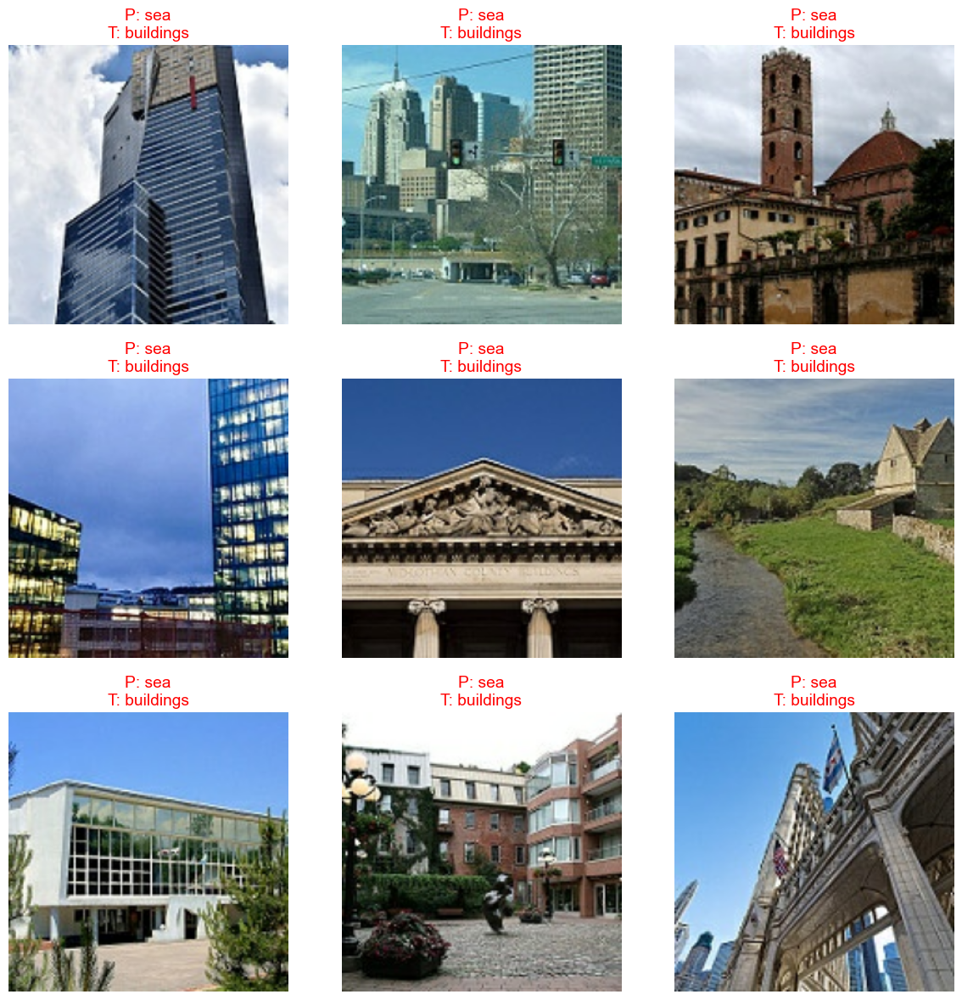

In [179]:
# ---------- 4) Show a few example predictions ----------
# Grab one batch from test_ds
for images, labels in test_ds.take(1):
    preds = Xception_model.predict(images)
    preds_classes = np.argmax(preds, axis=1)
    true_classes = labels.numpy()
    break

n = min(9, images.shape[0])
plt.figure(figsize=(12, 12))
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    img = images[i].numpy()
    # If images are in [0,255], convert to [0,1] for display
    if img.max() > 1.1:
        disp_img = img / 255.0
    else:
        disp_img = img
    plt.imshow(disp_img)
    pred_label = class_names[int(preds_classes[i])]
    true_label = class_names[int(true_classes[i])]
    title_color = "green" if pred_label == true_label else "red"
    plt.title(f"P: {pred_label}\nT: {true_label}", color=title_color)
    plt.axis("off")
plt.tight_layout()
plt.show()

In [180]:
input_shape = (256,256,3)

In [181]:
# -------------------------------------------------------------
# MobileNetV2 (Frozen Base)
# -------------------------------------------------------------
MobileNetV2_model = Sequential()

pretrained_mobilenet = MobileNetV2(
    include_top=False,
    input_shape=input_shape,
    pooling='avg',
    weights='imagenet'
)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_19528\1516391666.py:6: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  pretrained_mobilenet = MobileNetV2(


In [182]:
# Freeze base layers
for layer in pretrained_mobilenet.layers:
    layer.trainable = False

# Build head
MobileNetV2_model.add(pretrained_mobilenet)
MobileNetV2_model.add(Dense(512, activation='relu'))
MobileNetV2_model.add(Dense(256, activation='relu'))
MobileNetV2_model.add(Dropout(0.2))  # ✅ fixed typo
MobileNetV2_model.add(Dense(32, activation='relu'))
MobileNetV2_model.add(Dense(num_classes, activation='softmax'))

In [183]:
# Compile
MobileNetV2_model.compile(
    optimizer=Adam(learning_rate=0.003),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

MobileNetV2_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 1280)                │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,053,606 (11.65 MB)

 Trainable params: 795,622 (3.04 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [184]:
# Train
MobileNetV2_results = MobileNetV2_model.fit(
    train_ds,
    epochs=50,
    validation_data=val_ds,
    callbacks=[early_stop]
)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 29s 755ms/step - accuracy: 0.7045 - loss: 0.7613 - val_accuracy: 0.8764 - val_loss: 0.3389
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 675ms/step - accuracy: 0.8837 - loss: 0.3098 - val_accuracy: 0.8959 - val_loss: 0.2991
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 19s 676ms/step - accuracy: 0.9129 - loss: 0.2458 - val_accuracy: 0.8807 - val_loss: 0.3260
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 684ms/step - accuracy: 0.9286 - loss: 0.1938 - val_accuracy: 0.8872 - val_loss: 0.3170
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 683ms/step - accuracy: 0.9416 - loss: 0.1553 - val_accuracy: 0.8872 - val_loss: 0.3351
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 683ms/step - accuracy: 0.9535 - loss: 0.1278 - val_accuracy: 0.8633 - val_loss: 0.4699
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 666ms/step - accuracy: 0.9616 - loss: 0.1062 - val_accuracy: 0.8568 - val_loss: 0.4636
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 681ms/step - accuracy: 0.9405 - loss: 0.1577 - val_accu

In [185]:
save_path = "./intel/mbnetv2_trained_model.keras"
MobileNetV2_model.save(save_path, include_optimizer=False)   # exclude optimizer if you only need model for inference
print(f"Model saved to: {save_path}")

Model saved to: ./intel/mbnetv2_trained_model.keras


Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Collected images: (2806, 256, 256, 3) labels: (2806,)
Detected pixel range >1. Normalizing images by /255.0 before prediction.
Selected 60 samples (10 per class max).
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


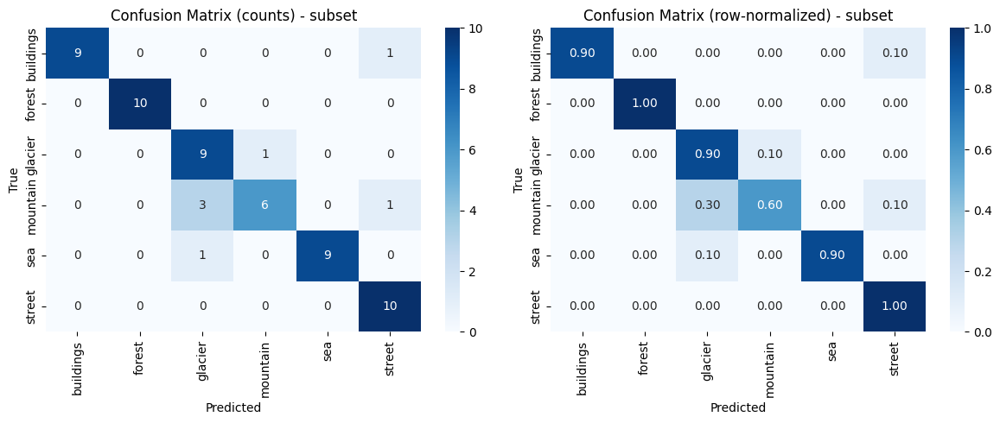


Classification Report (subset):

              precision    recall  f1-score   support

   buildings     1.0000    0.9000    0.9474        10
      forest     1.0000    1.0000    1.0000        10
     glacier     0.6923    0.9000    0.7826        10
    mountain     0.8571    0.6000    0.7059        10
         sea     1.0000    0.9000    0.9474        10
      street     0.8333    1.0000    0.9091        10

    accuracy                         0.8833        60
   macro avg     0.8971    0.8833    0.8821        60
weighted avg     0.8971    0.8833    0.8821        60



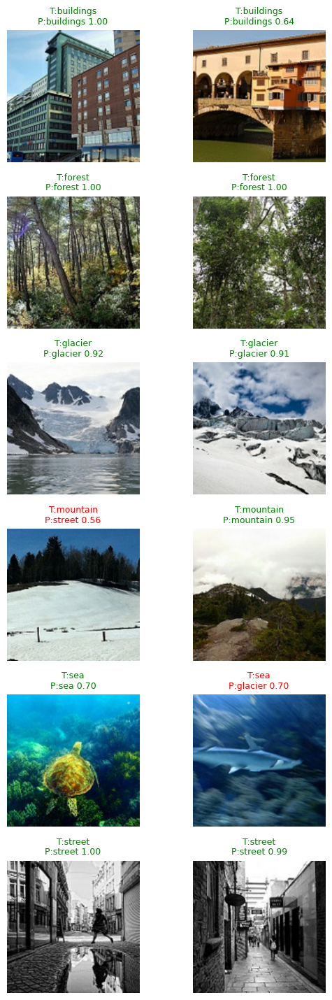

In [59]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import random
import os
save_path = "./intel/mbnetv2_trained_model.keras"
# -------- USER CONFIG --------
model = tf.keras.models.load_model(save_path)        # use your trained MobileNetV2 model
dataset = val_ds                  # use validation dataset
train_dir = "intel/train"         # to reconstruct class names
per_class = 10                    # max images to take per class (set lower to speed up)
predict_batch_size = 64           # batch size used for model.predict on subset
show_examples_per_class = 2       # examples to display per class (0 to disable)
random_seed = 42
# ------------------------------

random.seed(random_seed)
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

# Reconstruct class names (alphabetical)
class_names = sorted([d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))])
num_classes = len(class_names)
print("Class names:", class_names)

# Unbatch val dataset and collect (image, label) pairs into lists (up to a limit to avoid OOM)
images = []
labels = []
for batch_x, batch_y in dataset:
    bx = batch_x.numpy()
    by = batch_y.numpy()
    for i in range(bx.shape[0]):
        images.append(bx[i])
        labels.append(int(by[i]))
# Convert to arrays
images = np.array(images)
labels = np.array(labels)
print("Collected images:", images.shape, "labels:", labels.shape)

# Detect whether images are in 0-255 range (and normalize if needed)
if images.max() > 1.1:
    print("Detected pixel range >1. Normalizing images by /255.0 before prediction.")
    images_norm = images.astype(np.float32) / 255.0
else:
    images_norm = images.astype(np.float32)

# Stratified sampling: pick up to `per_class` images per class
selected_idxs = []
for cls in range(num_classes):
    idxs = np.where(labels == cls)[0].tolist()
    if len(idxs) == 0:
        continue
    chosen = random.sample(idxs, min(per_class, len(idxs)))
    selected_idxs.extend(chosen)

# Keep selection order deterministic
selected_idxs = sorted(selected_idxs)
print(f"Selected {len(selected_idxs)} samples ({per_class} per class max).")

# Build subset arrays
X_subset = images_norm[selected_idxs]
y_subset = labels[selected_idxs]

# Predict in batches
subset_ds = tf.data.Dataset.from_tensor_slices(X_subset).batch(predict_batch_size)
y_prob = model.predict(subset_ds, verbose=1)
y_pred = np.argmax(y_prob, axis=1)

# Confusion matrix & classification report (on subset)
cm = confusion_matrix(y_subset, y_pred)
cm_norm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-12)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix (counts) - subset")
plt.xlabel("Predicted"); plt.ylabel("True")

plt.subplot(1,2,2)
sns.heatmap(cm_norm, annot=True, fmt='.2f', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix (row-normalized) - subset")
plt.xlabel("Predicted"); plt.ylabel("True")

plt.tight_layout(); plt.show()

print("\nClassification Report (subset):\n")
print(classification_report(y_subset, y_pred, target_names=class_names, digits=4))

# Optional: show a small grid of example predictions (stratified by true class)
if show_examples_per_class > 0:
    per_row = show_examples_per_class
    rows = num_classes
    plt.figure(figsize=(per_row * 3, rows * 2.4))
    plot_idx = 1
    for true_cls in range(num_classes):
        cls_idxs = [i for i, idx in enumerate(selected_idxs) if y_subset[i] == true_cls]
        if len(cls_idxs) == 0:
            continue
        pick = cls_idxs[:show_examples_per_class]
        for p in pick:
            img = X_subset[p]
            pred = y_pred[p]
            conf = float(y_prob[p, pred])
            plt.subplot(rows, per_row, plot_idx)
            disp = img
            # if image still in 0-255 range, scale for display
            if disp.max() > 1.1:
                disp = disp / 255.0
            plt.imshow(disp.astype(np.float32))
            color = "green" if pred == y_subset[p] else "red"
            plt.title(f"T:{class_names[y_subset[p]]}\nP:{class_names[pred]} {conf:.2f}", color=color, fontsize=9)
            plt.axis("off")
            plot_idx += 1
    plt.tight_layout()
    plt.show()


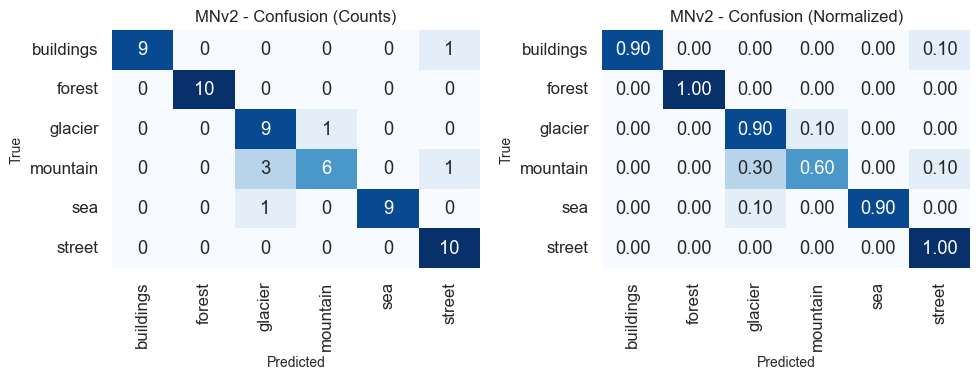

In [60]:
# ---------- Compact Confusion Matrix (Smaller Size) ----------
plt.figure(figsize=(10, 4))   # smaller figure
sns.set(font_scale=1.1)       # slightly smaller text

# Raw counts
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
            xticklabels=class_names, yticklabels=class_names,
            cbar=False)
plt.title("MNv2 - Confusion (Counts)", fontsize=12)
plt.xlabel("Predicted", fontsize=10)
plt.ylabel("True", fontsize=10)

# Normalized
plt.subplot(1, 2, 2)
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap="Blues",
            xticklabels=class_names, yticklabels=class_names,
            cbar=False)
plt.title("MNv2 - Confusion (Normalized)", fontsize=12)
plt.xlabel("Predicted", fontsize=10)
plt.ylabel("True", fontsize=10)

plt.tight_layout()
plt.show()

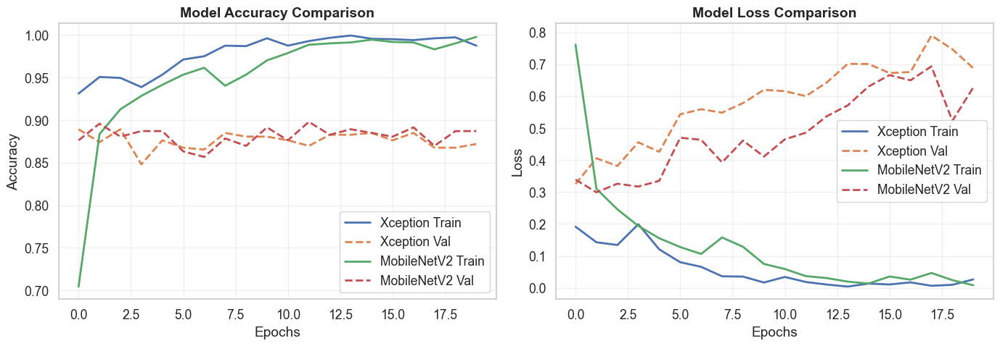

In [187]:
import pandas as pd

# Convert histories to DataFrames
hist_x = pd.DataFrame(Xception_results.history)
hist_m = pd.DataFrame(MobileNetV2_results.history)

plt.figure(figsize=(14, 5))

# ---- Accuracy ----
plt.subplot(1, 2, 1)
plt.plot(hist_x["accuracy"], label="Xception Train", linewidth=2)
plt.plot(hist_x["val_accuracy"], label="Xception Val", linestyle="--", linewidth=2)
plt.plot(hist_m["accuracy"], label="MobileNetV2 Train", linewidth=2)
plt.plot(hist_m["val_accuracy"], label="MobileNetV2 Val", linestyle="--", linewidth=2)
plt.title("Model Accuracy Comparison", fontsize=14, fontweight="bold")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(alpha=0.3)

# ---- Loss ----
plt.subplot(1, 2, 2)
plt.plot(hist_x["loss"], label="Xception Train", linewidth=2)
plt.plot(hist_x["val_loss"], label="Xception Val", linestyle="--", linewidth=2)
plt.plot(hist_m["loss"], label="MobileNetV2 Train", linewidth=2)
plt.plot(hist_m["val_loss"], label="MobileNetV2 Val", linestyle="--", linewidth=2)
plt.title("Model Loss Comparison", fontsize=14, fontweight="bold")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [188]:
best_model = MobileNetV2_model  # or Xception_model / model (your CNN)
best_model.save("intel_model.keras")
print("✅ Best model saved as 'best_intel_model.keras'")

✅ Best model saved as 'best_intel_model.keras'


In [189]:
from tensorflow.keras.utils import image_dataset_from_directory
class_names = image_dataset_from_directory("intel/train").class_names

Found 14034 files belonging to 6 classes.


✅ Model loaded successfully from: ./intel/mbnetv2_trained_model.keras


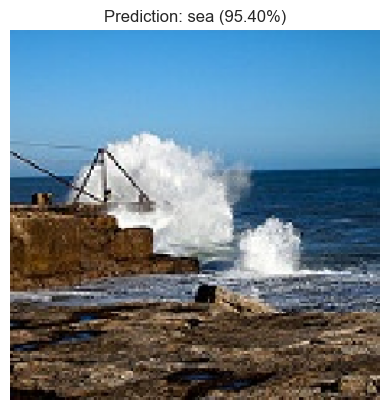

🌸 Predicted Class: sea  |  Confidence: 95.40%
✅ Predicted: sea (95.40%)


In [192]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import os

# -------------------------------------------------------------
# 1️⃣ Load the saved model
# -------------------------------------------------------------
model_path = "./intel/mbnetv2_trained_model.keras"  # change path if needed

try:
    loaded_model = tf.keras.models.load_model(model_path)
    print(f"✅ Model loaded successfully from: {model_path}")
except Exception as e:
    raise RuntimeError(f"❌ Failed to load model from '{model_path}': {e}")

# -------------------------------------------------------------
# 2️⃣ Class names (ensure same order as during training)
# -------------------------------------------------------------

# If you have the training dataset available, you can reload them:
# from tensorflow.keras.utils import image_dataset_from_directory
# class_names = image_dataset_from_directory("intel/train").class_names


# -------------------------------------------------------------
# 3️⃣ Define the prediction function
# -------------------------------------------------------------
def predict_intel(image_path, model, class_names, img_size=(256, 256)):
    if not os.path.exists(image_path):
        print(f"❌ Image not found: {image_path}")
        return None, None

    try:
        img = image.load_img(image_path, target_size=img_size)
    except Exception as e:
        print(f"⚠️ Could not load image: {e}")
        return None, None

    # Convert and normalize
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    # Predict
    predictions = model.predict(img_array, verbose=0)
    predicted_idx = np.argmax(predictions[0])
    predicted_class = class_names[predicted_idx]
    confidence = np.max(predictions[0]) * 100

    # Display result
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction: {predicted_class} ({confidence:.2f}%)", fontsize=12)
    plt.show()

    print(f"🌸 Predicted Class: {predicted_class}  |  Confidence: {confidence:.2f}%")
    return predicted_class, confidence


# -------------------------------------------------------------
# 4️⃣ Example usage — predict one image
# -------------------------------------------------------------
test_image_path = "intel/test/sea/20072.jpg"  # update this path
predicted_class, conf = predict_intel(test_image_path, loaded_model, class_names)
print(f"✅ Predicted: {predicted_class} ({conf:.2f}%)")


🔹 Predicting 10 random images from 'intel/test/mountain'



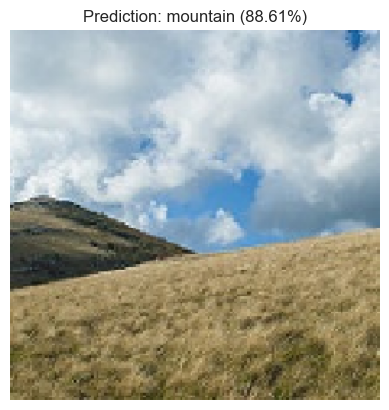

🌸 Predicted Class: mountain  |  Confidence: 88.61%


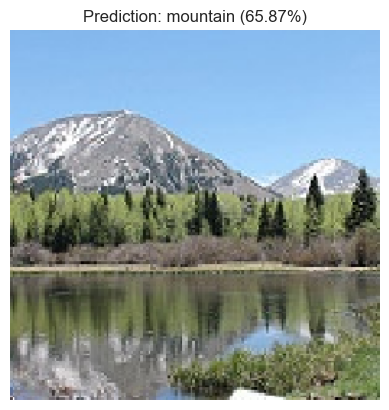

🌸 Predicted Class: mountain  |  Confidence: 65.87%


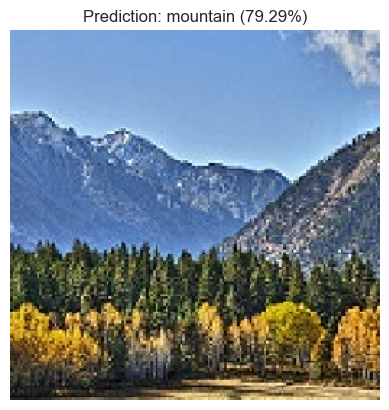

🌸 Predicted Class: mountain  |  Confidence: 79.29%


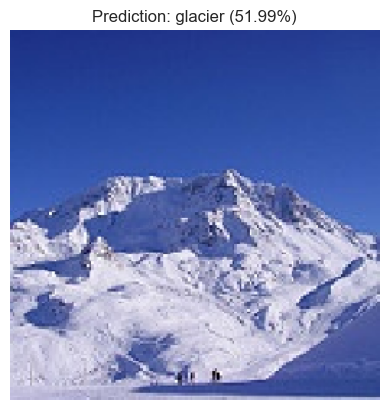

🌸 Predicted Class: glacier  |  Confidence: 51.99%


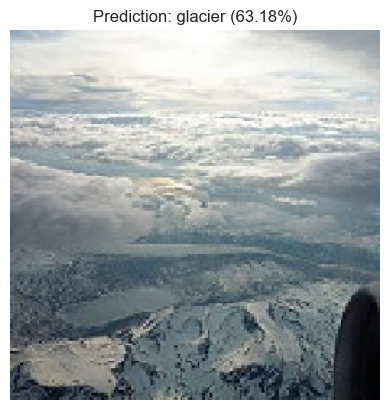

🌸 Predicted Class: glacier  |  Confidence: 63.18%


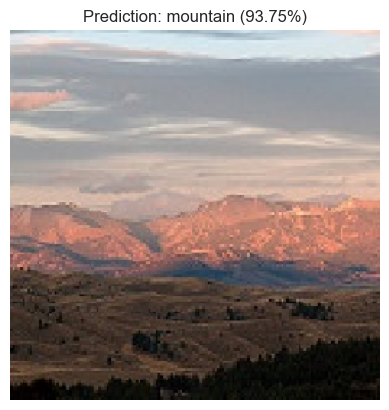

🌸 Predicted Class: mountain  |  Confidence: 93.75%


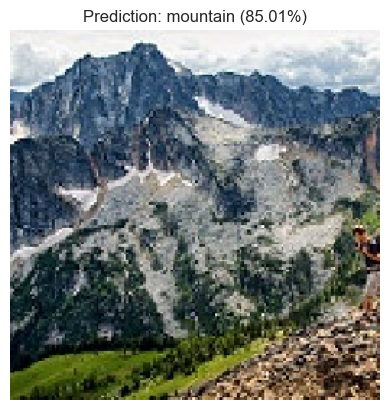

🌸 Predicted Class: mountain  |  Confidence: 85.01%


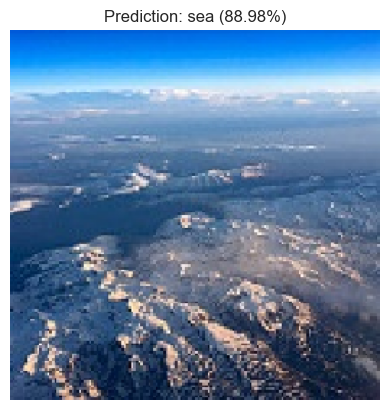

🌸 Predicted Class: sea  |  Confidence: 88.98%


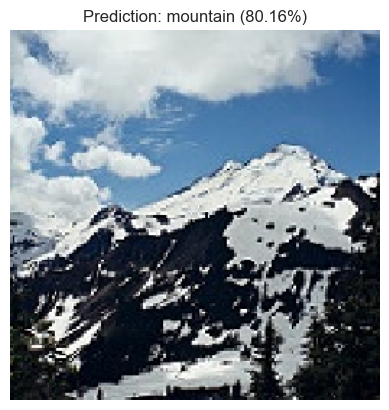

🌸 Predicted Class: mountain  |  Confidence: 80.16%


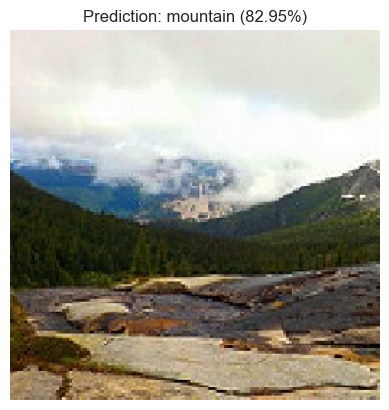

🌸 Predicted Class: mountain  |  Confidence: 82.95%

--- 🌊 Random Predictions Summary ---
20767.jpg                 → mountain     (88.61%)
20703.jpg                 → mountain     (65.87%)
21774.jpg                 → mountain     (79.29%)
20820.jpg                 → glacier      (51.99%)
24036.jpg                 → glacier      (63.18%)
22724.jpg                 → mountain     (93.75%)
22051.jpg                 → mountain     (85.01%)
20522.jpg                 → sea          (88.98%)
21909.jpg                 → mountain     (80.16%)
22483.jpg                 → mountain     (82.95%)


In [193]:
import os
import random
def predict_random_images(folder_path, model, class_names, img_size=(256, 256), num_images=10):
    """Randomly select and predict up to `num_images` images from the given folder."""
    results = []

    if not os.path.isdir(folder_path):
        print(f"❌ Folder not found: {folder_path}")
        return results

    # List all image files
    all_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    if not all_files:
        print("⚠️ No images found in the folder!")
        return results

    # Randomly choose up to num_images
    selected_files = random.sample(all_files, min(num_images, len(all_files)))

    print(f"🔹 Predicting {len(selected_files)} random images from '{folder_path}'\n")

    for filename in selected_files:
        file_path = os.path.join(folder_path, filename)
        pred_class, conf = predict_intel(file_path, model, class_names, img_size)
        if pred_class:
            results.append((filename, pred_class, conf))

    return results

# 🧠 Example usage
folder_to_test = "intel/test/mountain"  # change this to your desired class folder
results = predict_random_images(folder_to_test, loaded_model, class_names)

print("\n--- 🌊 Random Predictions Summary ---")
for fname, pred, conf in results:
    print(f"{fname:25s} → {pred:12s} ({conf:.2f}%)")


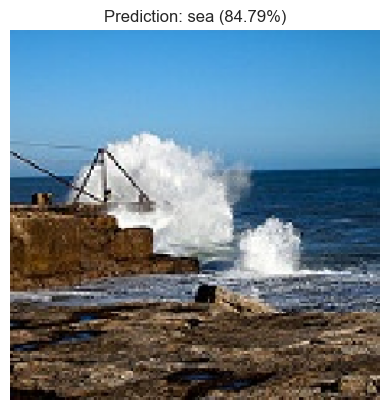

🌸 Predicted Class: sea  |  Confidence: 84.79%


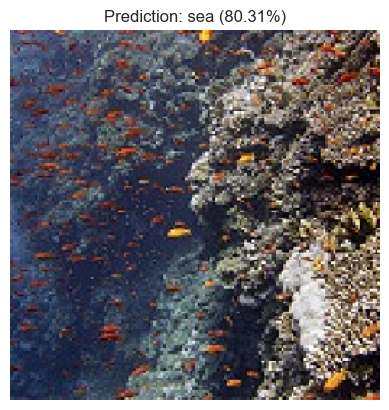

🌸 Predicted Class: sea  |  Confidence: 80.31%


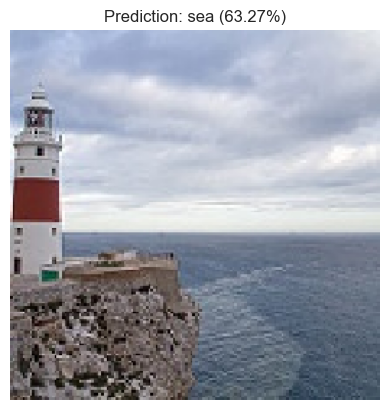

🌸 Predicted Class: sea  |  Confidence: 63.27%


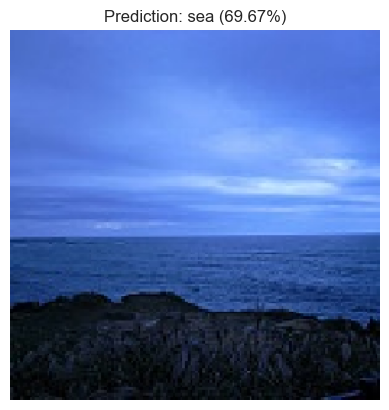

🌸 Predicted Class: sea  |  Confidence: 69.67%


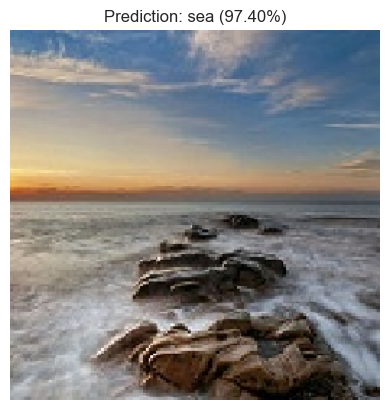

🌸 Predicted Class: sea  |  Confidence: 97.40%


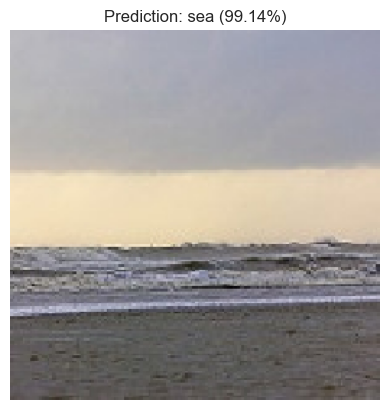

🌸 Predicted Class: sea  |  Confidence: 99.14%


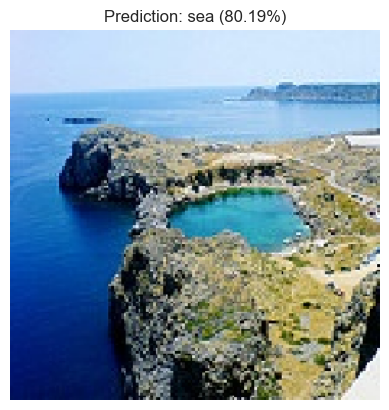

🌸 Predicted Class: sea  |  Confidence: 80.19%


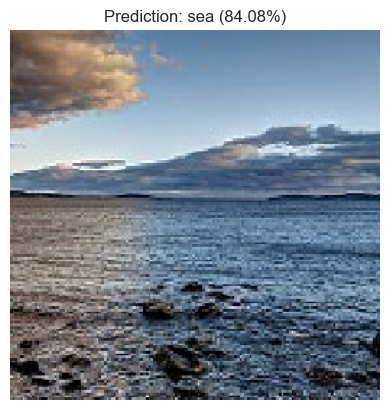

🌸 Predicted Class: sea  |  Confidence: 84.08%


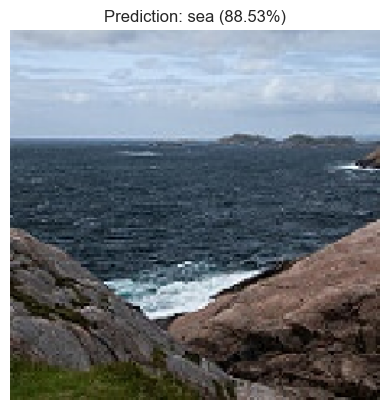

🌸 Predicted Class: sea  |  Confidence: 88.53%


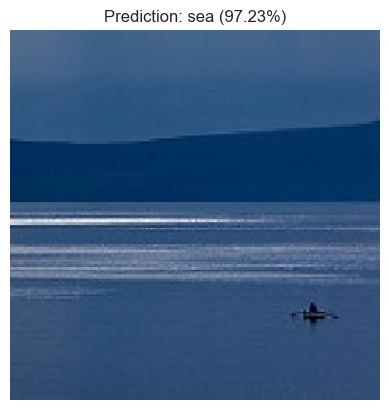

🌸 Predicted Class: sea  |  Confidence: 97.23%


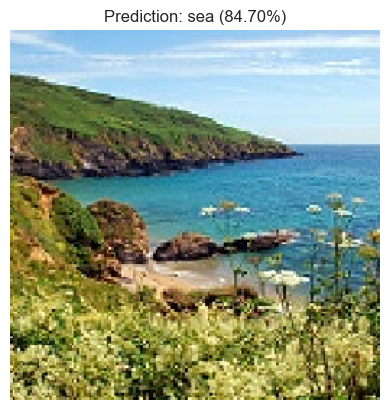

🌸 Predicted Class: sea  |  Confidence: 84.70%


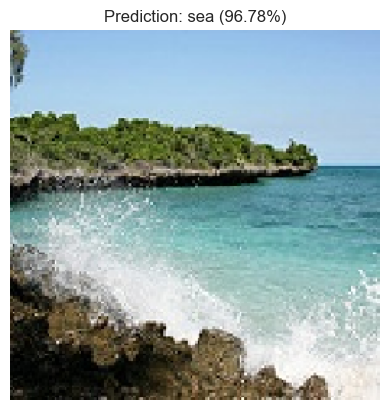

🌸 Predicted Class: sea  |  Confidence: 96.78%


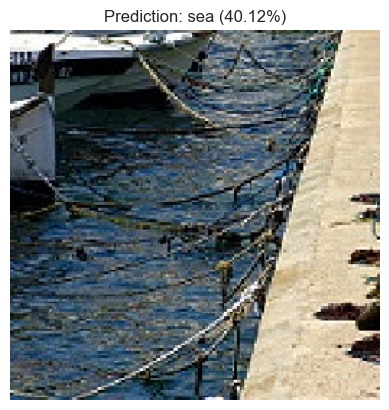

🌸 Predicted Class: sea  |  Confidence: 40.12%


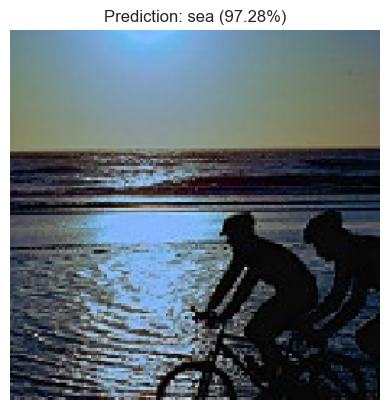

🌸 Predicted Class: sea  |  Confidence: 97.28%


KeyboardInterrupt: 

In [128]:
# -------------------------------------------------------------
# 5️⃣ (Optional) Predict all images in a test subfolder
# -------------------------------------------------------------
def predict_folder(folder_path, model, class_names, img_size=(256, 256)):
    results = []
    if not os.path.isdir(folder_path):
        print(f"❌ Folder not found: {folder_path}")
        return results

    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):
            pred_class, conf = predict_intel(file_path, model, class_names, img_size)
            if pred_class:
                results.append((filename, pred_class, conf))
    return results

# Example usage:
folder_to_test = "intel/test/sea"
results = predict_folder(folder_to_test, loaded_model, class_names)
for fname, pred, conf in results:
    print(f"{fname:25s} → {pred:12s} ({conf:.2f}%)")